Welcome to my notebook for thermal comofort calculation and representation.

Notebook created by Justin Jelacic COSC MSCM student @ TAMU 

In [ ]:
#To excute this notebook you need to update the drive links to your own as well as get api keys

In [ ]:
# Importing libraries --- delete unneeded + add description of code to understand + make note about drive

import os
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter
import seaborn as sns
import pandas as pd
import seaborn as sns
import numpy as np
import datetime
import requests
import pandas as pd

In [ ]:
#mount your drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#notebook takes about 10 min to run - data retrival takes time as well as the LSTM machine learning model. TYP RSME of 0.5 on LSTM model = within 0.5 W/cm2 = accurate for our use

This notebook uses Open Weather Map data, Historical data from NREL for machine learning to aquairre a prediction of GHI and The COMFA model as well as the COMFA courtyard model to calculate the thermal comofrt in near time. parameters can be cahnged from the average human to be customized to an individual

In [ ]:
### Imperical test to help understnd conditions

# Set up the API request parameters
url = "https://api.openweathermap.org/data/2.5/weather"
params = {
    "q": "Houston",
    "appid": "YOURAPIKEY",
    "units": "imperial"
}

# Send the API request and retrieve the response
response = requests.get(url, params=params)

# Check if the request was successful
if response.status_code == 200:
    # Extract the relevant data from the JSON response
    weather_data = response.json()
    temperature = weather_data["main"]["temp"]
    humidity = weather_data["main"]["humidity"]
    description = weather_data["weather"][0]["description"]
    wind_speed = weather_data["wind"]["speed"]

    
    # Print the weather information
    print(f"Current temperature in Houston: {temperature} °F")
    print(f"Humidity in Houston: {humidity}%")
    print(f"Description of the weather in Houston: {description}")
    print(f"Wind speed in Houston: {wind_speed} mph")
else:
    print("Failed to retrieve weather data")


Current temperature in Houston: 77.4 °F
Humidity in Houston: 65%
Description of the weather in Houston: clear sky
Wind speed in Houston: 10.36 mph


Start collecting near/real-time data

In [ ]:
from geopy.geocoders import Nominatim

In [ ]:
# get the coordinates for your site
# Create a geolocator object
geolocator = Nominatim(user_agent="my-app")

# Define the addresses you want to geocode
addresses = ["2520 Airline Dr, Houston, TX 77009"]

# Initialize a dictionary to hold the location information
locations = {"latitude": [], "longitude": []}

# Loop over the addresses and get the latitude and longitude for each one
for address in addresses:
    # Get location information from the address
    location = geolocator.geocode(address)
    
    # Extract latitude and longitude values from location object
    latitude = location.latitude
    longitude = location.longitude
    
    # Add latitude and longitude values to the dictionary
    locations["latitude"].append(latitude)
    locations["longitude"].append(longitude)

# Create a DataFrame from the location information
df = pd.DataFrame(locations)

# Print the DataFrame
print(df)


    latitude  longitude
0  29.810226 -95.381617


In [ ]:
#get the environmental indicators
# Set up the API request parameters
url = "https://api.openweathermap.org/data/2.5/weather"
params = {
    "q": "Houston",
    "appid": "YOURAPIKEY",
    "units": "metric"
}

# Send the API request and retrieve the response
response = requests.get(url, params=params)

# Check if the request was successful
if response.status_code == 200:
    # Extract the relevant data from the JSON response
    weather_data = response.json()
    temperature = weather_data["main"]["temp"]
    humidity = weather_data["main"]["humidity"]
    description = weather_data["weather"][0]["description"]
    wind_speed = weather_data["wind"]["speed"]

    # Create a dictionary with the weather data
    weather_dict = {
        "Temperature": [temperature],
        "Humidity": [humidity],
        "Description": [description],
        "Wind Speed": [wind_speed]
    }

    # Create a DataFrame from the dictionary
    dfHHH = pd.DataFrame.from_dict(weather_dict)

    # Print the weather information
    print(dfHHH)
else:
    print("Failed to retrieve weather data")


   Temperature  Humidity Description  Wind Speed
0        25.25        65   clear sky        4.63


In [ ]:
!pip install pysolar

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.1/47.1 kB 5.1 MB/s eta 0:00:00


In [ ]:
#get the solar zenith angle
import pysolar.solar as ps
import datetime
import pytz

# Define the function to calculate solar zenith angle
def calculate_solar_zenith_angle(latitude, longitude, date_time):
    altitude_deg = ps.get_altitude(latitude, longitude, date_time)
    solar_zenith_angle_deg = 90 - altitude_deg
    return solar_zenith_angle_deg

# Load the input data from your DataFrame
latitude = df['latitude'].iloc[0]  # replace 'Latitude' with the name of your latitude column
longitude = df['longitude'].iloc[0]  # replace 'Longitude' with the name of your longitude column

# Define the date and time to calculate the solar zenith angle
local_tz = pytz.timezone('US/Central')  # replace 'US/Central' with your local timezone
date_time = datetime.datetime.now(local_tz)

# Calculate the solar zenith angle
solar_zenith_angle_deg = calculate_solar_zenith_angle(latitude, longitude, date_time)

# Print the solar zenith angle
print(f"The solar zenith angle is {solar_zenith_angle_deg:.2f} degrees.")

# Add the solar zenith angle to your DataFrame
dfHHH['Solar Zenith Angle'] = solar_zenith_angle_deg


The solar zenith angle is 94.50 degrees.


/usr/local/lib/python3.10/dist-packages/pysolar/solartime.py:111: UserWarning: I don't know about leap seconds after 2021
  warnings.warn \


In [ ]:
#display the data
dfHHH

,Temperature,Humidity,Description,Wind Speed,Solar Zenith Angle
0,25.25,65,clear sky,4.63,94.49554


In [ ]:
#add to the dataframe
Finaldf = dfHHH 
Finaldf['latitude'] = df['latitude']
Finaldf['longitude'] = df['longitude']


In [ ]:
# Get current time
now = datetime.datetime.now()

# Extract month, day, hour, and minute values
month = now.month
day = now.day
hour = now.hour
minute = now.minute

# Add new columns to Finaldf
Finaldf['Month'] = month
Finaldf['Day'] = day
Finaldf['Hour'] = hour
Finaldf['Minute'] = minute


In [ ]:
#display the data
Finaldf

,Temperature,Humidity,Description,Wind Speed,Solar Zenith Angle,latitude,longitude,Month,Day,Hour,Minute
0,25.25,65,clear sky,4.63,94.49554,29.810226,-95.381617,5,2,1,16


In [ ]:
pip install srtm.py


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.9/99.9 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for srtm.py: filename=SRTM.py-0.3.7-py3-none-any.whl size=105861 sha256=1898122b6c00b7b94f0803a0ffcc460096e51bf550132d9a95619f832245d352
  Stored in directory: /root/.cache/pip/wheels/86/8d/be/cafef7d5285bb6b4a7a42ba3fc72b6c9edccb0d02679acb8ea
Successfully built srtm.py


In [ ]:
#get the elevation based on location
import srtm

# create an SRTM object
elevation_data = srtm.get_data()

# define a function to get the altitude for a given latitude and longitude pair
def get_altitude(lat, lng):
    altitude = elevation_data.get_elevation(lat, lng)
    print(f"Latitude: {lat}, Longitude: {lng}, Altitude: {altitude}")
    return altitude

# iterate through each row in the DataFrame
for index, row in Finaldf.iterrows(): 
    # get the altitude for the latitude and longitude values in this row
    altitude = get_altitude(row['latitude'], row['longitude'])
    
    # add the altitude as a new column to this row in the DataFrame
    Finaldf.at[index, 'Elevation'] = altitude


Creating /root/.cache/srtm
4 25934402
Latitude: 29.8102257, Longitude: -95.3816173, Altitude: 20


In [ ]:
#Get the altitude angle fo the relative location
import ephem

# Define observer location function
def get_observer(row):
    observer = ephem.Observer()
    observer.lon = str(row['longitude'])  # Longitude
    observer.lat = str(row['latitude'])  # Latitude
    observer.elevation = row['Elevation']  # Elevation in meters
    return observer


# Compute sun's altitude for each row and add a new column for it
now = datetime.datetime.now()

altitudes = []
for index, row in Finaldf.iterrows():
    observer = get_observer(row)
    observer.date = now.strftime('%Y/%m/%d %H:%M:%S')  # Use current date and time in UTC
    sun = ephem.Sun()
    sun.compute(observer)
    altitude = sun.alt * 180 / ephem.pi  # Convert altitude to degrees
    altitudes.append(altitude)

Finaldf['Altitude'] = altitudes

# Print the updated DataFrame
print(Finaldf)


   Temperature  Humidity Description  Wind Speed  Solar Zenith Angle  \
0        25.25        65   clear sky        4.63            94.49554   

    latitude  longitude  Month  Day  Hour  Minute  Elevation  Altitude  
0  29.810226 -95.381617      5    2     1      16       20.0 -0.332963  


LSTM model to predict solar radiation- Global Horizontal Iradiance (GHI) based on historical data from Houston using NREL. This is done becasuse GHI is not avalible in local weather data.

In [ ]:
#NREL limitation only up to 2021 avalible
#Create data frame for location desired

# Add the Year column to the DataFrame
df["Year"] = 2021


# Create a new DataFrame with the same location information but a different year
new_data = {
    "latitude": df["latitude"],
    "longitude": df["longitude"],
    "Year": 2020
}
new_row = pd.DataFrame(new_data)

# Append the new row to the original DataFrame
df = df.append(new_row, ignore_index=True)

# Print the updated DataFrame with the new row
print(df)



    latitude  longitude  Year
0  29.810226 -95.381617  2021
1  29.810226 -95.381617  2020


<ipython-input-19-6497fcde1afc>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)


NREL sometimes has limitations. If the cell fails rerun it. API requests can sometimes get delayed.

In [ ]:
#NREL data pull for relavant location
import requests
import urllib.parse
import time
import io
import zipfile



API_KEY = "YOURAPIKEY"
EMAIL = "EMAIL"
BASE_URL = "https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-2-2-download.json?"

def main():
    
    df['Year'] = df['Year'].astype(str).tolist()
    input_data = {
        'attributes': 'air_temperature,clearsky_dhi,clearsky_dni,clearsky_ghi,cloud_type,dew_point,dhi,dni,fill_flag,ghi,relative_humidity,solar_zenith_angle,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed,ghuv-280-400,ghuv-295-385',
        'interval': '30',
        'to_utc': 'false',
        'api_key': API_KEY,
        'email': EMAIL,
    }
    new_df = pd.DataFrame() # initialize new_df variable outside the if block
    for i, row in df.iterrows():
        name = str(row['Year'])
        input_data['names'] = [name]
        lat = row['latitude']
        lon = row['longitude']
        wkt = f'POINT({lon} {lat})'
        input_data['wkt'] = wkt
        print(f"Processing name: {name}")
        response = send_request(input_data)
        if '.csv' in BASE_URL:
            data = pd.read_csv(response.url)
            print(f'Response data (Location): {data}')
        else:
            download_url = response.json()['outputs']['downloadUrl']
            print(response.json()['outputs']['message'])
            print(f"Data can be downloaded from this url when ready: {download_url}")
            time.sleep(60) # delay for 60 seconds to prevent rate limiting
            zip_file = download_zip_file(download_url)
            new_df = extract_csv(zip_file)
            # Filter rows for the current year
            data = new_df[new_df['Year'] == int(name)]
            data.reset_index(drop=True, inplace=True)
            # Save data to file
            file_name = f"{name}_{lat}_{lon}.csv"
            data.to_csv(file_name, index=False)
            print(f"Saved data to {file_name}")
            # Copy file to Google Drive
            !cp $file_name "YOURDRIVE"
            print(f"Copied {file_name} to Google Drive")
            print(f'Extracted data (Locationx): {data}')
        print(f'Processed')
        time.sleep(2) # delay for 10 seconds to prevent rate limiting
    print(f"New df: {new_df}") # print new_df variable outside the if block



def send_request(input_data):
    headers = {'x-api-key': API_KEY}
    response = requests.post(BASE_URL, input_data, headers=headers)
    if response.status_code != 200:
        print(f"An error has occurred with the server or the request. The request response code/status: {response.status_code} {response.reason}")
        print(f"The response body: {response.text}")
        exit(1)
    return response

def download_zip_file(url):
    time.sleep(4) # delay for 10 seconds to prevent rate limiting
    response = requests.get(url)
    zip_file = io.BytesIO(response.content)
    return zip_file


def extract_csv(zip_file):
    with zipfile.ZipFile(zip_file) as z:
        # Assuming there is only one CSV file in the zip
        csv_file_name = z.namelist()[0]
        with z.open(csv_file_name) as f:
            try:
                data = pd.read_csv(f, skiprows=2, usecols=['Year', 'Month', 'Day', 'Hour', 'Minute', 'Temperature', 'Clearsky DHI', 'Clearsky DNI', 'Clearsky GHI', 'Cloud Type', 'Dew Point', 'DHI', 'DNI', 'Fill Flag', 'GHI', 'Relative Humidity', 'Solar Zenith Angle', 'Surface Albedo', 'Pressure', 'Precipitable Water', 'Wind Direction', 'Wind Speed', 'Global Horizontal UV Irradiance (280-400nm)', 'Global Horizontal UV Irradiance (295-385nm)'])
            except pd.errors.EmptyDataError:
                data = pd.DataFrame()
                print("Empty Data Frame")
        
    return data
    df['Year'] = df['Year'].astype(str).tolist()

if __name__ == "__main__":
    main()

Processing name: 2021
File generation in progress. An email will be sent to jjelacic@tamu.edu when the download is ready.
Data can be downloaded from this url when ready: https://mapfiles.nrel.gov/data/solar/39bdee98746bac50351743bf7fbc55cc.zip
Saved data to 2021_29.8102257_-95.3816173.csv
Copied 2021_29.8102257_-95.3816173.csv to Google Drive
Extracted data (Locationx):        Year  Month  Day  Hour  Minute  Temperature  Clearsky DHI  \
0      2021      1    1     0       0          5.9             0   
1      2021      1    1     0      30          5.6             0   
2      2021      1    1     1       0          5.3             0   
3      2021      1    1     1      30          4.9             0   
4      2021      1    1     2       0          4.6             0   
...     ...    ...  ...   ...     ...          ...           ...   
17515  2021     12   31    21      30          7.4             0   
17516  2021     12   31    22       0          7.2             0   
17517  2021   

In [ ]:
### Retrive both the 2020 and 2021 for 2 years * 365 days * 24 hours * 2 for 30 min data for 35,040 rows of data

# Replace this with the path to the CSV file on your Google Drive
file_path = "YOURFILEPATHFILE1.csv"
file_path2 = "YOURFILEPATHFILE2.csv"

# Load the CSV file into a DataFrame
df1 = pd.read_csv(file_path)
df2 = pd.read_csv(file_path2)

combined_df = pd.concat([df1, df2], ignore_index=True)

# Print the first 5 rows of the DataFrame
print(df.head())


    latitude  longitude  Year
0  29.810226 -95.381617  2021
1  29.810226 -95.381617  2020


In [ ]:
#display data for ML model
print(combined_df)

       Year  Month  Day  Hour  Minute  Temperature  Clearsky DHI  \
0      2021      1    1     0       0          5.9             0   
1      2021      1    1     0      30          5.6             0   
2      2021      1    1     1       0          5.3             0   
3      2021      1    1     1      30          4.9             0   
4      2021      1    1     2       0          4.6             0   
...     ...    ...  ...   ...     ...          ...           ...   
35035  2020     12   31    21      30         11.0             0   
35036  2020     12   31    22       0         10.7             0   
35037  2020     12   31    22      30         10.5             0   
35038  2020     12   31    23       0         10.4             0   
35039  2020     12   31    23      30         10.3             0   

       Clearsky DNI  Clearsky GHI  Cloud Type  ...  GHI  Relative Humidity  \
0                 0             0           0  ...    0              84.23   
1                 0        

In [ ]:
#convert to integer
df['Year'] = df['Year'].astype('int64')  # Convert 'Year' column to int64
merged_df = pd.merge(combined_df, df, on='Year')



In [ ]:
#display column names
print(merged_df.columns)

Index(['Year', 'Month', 'Day', 'Hour', 'Minute', 'Temperature', 'Clearsky DHI',
       'Clearsky DNI', 'Clearsky GHI', 'Cloud Type', 'Dew Point', 'DHI', 'DNI',
       'Fill Flag', 'GHI', 'Relative Humidity', 'Solar Zenith Angle',
       'Surface Albedo', 'Pressure', 'Precipitable Water', 'Wind Direction',
       'Wind Speed', 'Global Horizontal UV Irradiance (280-400nm)',
       'Global Horizontal UV Irradiance (295-385nm)', 'latitude', 'longitude'],
      dtype='object')


In [ ]:
#look at the data to see it all checks out
merged_df

,Year,Month,Day,Hour,Minute,Temperature,Clearsky DHI,Clearsky DNI,Clearsky GHI,Cloud Type,...,Solar Zenith Angle,Surface Albedo,Pressure,Precipitable Water,Wind Direction,Wind Speed,Global Horizontal UV Irradiance (280-400nm),Global Horizontal UV Irradiance (295-385nm),latitude,longitude
0,2021,1,1,0,0,5.9,0,0,0,0,...,171.17,0.14,1007,1.4,239,3.9,0.0,0.0,29.810226,-95.381617
1,2021,1,1,0,30,5.6,0,0,0,0,...,173.09,0.14,1007,1.4,241,3.9,0.0,0.0,29.810226,-95.381617
2,2021,1,1,1,0,5.3,0,0,0,4,...,169.62,0.14,1008,1.4,243,3.9,0.0,0.0,29.810226,-95.381617
3,2021,1,1,1,30,4.9,0,0,0,0,...,163.96,0.14,1008,1.4,243,3.8,0.0,0.0,29.810226,-95.381617
4,2021,1,1,2,0,4.6,0,0,0,0,...,157.72,0.14,1008,1.4,243,3.7,0.0,0.0,29.810226,-95.381617
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35035,2020,12,31,21,30,11.0,0,0,0,7,...,140.56,0.14,1019,1.3,354,0.6,0.0,0.0,29.810226,-95.381617
35036,2020,12,31,22,0,10.7,0,0,0,7,...,147.06,0.14,1019,1.3,359,0.6,0.0,0.0,29.810226,-95.381617
35037,2020,12,31,22,30,10.5,0,0,0,7,...,153.54,0.14,1019,1.4,188,0.6,0.0,0.0,29.810226,-95.381617
35038,2020,12,31,23,0,10.4,0,0,0,7,...,159.92,0.14,1018,1.4,17,0.6,0.0,0.0,29.810226,-95.381617


In [ ]:
# specify the columns to be converted to float
cols_to_convert = ['Year', 'Month', 'Day', 'Hour', 'Minute', 'Temperature',
                   'Clearsky DHI', 'Clearsky DNI', 'Clearsky GHI', 'Cloud Type',
                   'Dew Point', 'DHI', 'DNI', 'Fill Flag', 'GHI',
                   'Relative Humidity', 'Solar Zenith Angle', 'Surface Albedo',
                   'Pressure', 'Precipitable Water', 'Wind Direction',
                   'Wind Speed', 'Global Horizontal UV Irradiance (280-400nm)',
                   'Global Horizontal UV Irradiance (295-385nm)', 'latitude', 'longitude']

# convert the columns to float
merged_df[cols_to_convert] = merged_df[cols_to_convert].astype(float)

# display the updated DataFrame
print(merged_df.info())


<class 'pandas.core.frame.DataFrame'>
Int64Index: 35040 entries, 0 to 35039
Data columns (total 26 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Year                                         35040 non-null  float64
 1   Month                                        35040 non-null  float64
 2   Day                                          35040 non-null  float64
 3   Hour                                         35040 non-null  float64
 4   Minute                                       35040 non-null  float64
 5   Temperature                                  35040 non-null  float64
 6   Clearsky DHI                                 35040 non-null  float64
 7   Clearsky DNI                                 35040 non-null  float64
 8   Clearsky GHI                                 35040 non-null  float64
 9   Cloud Type                                   35040 non-null  float64
 10

In [ ]:
#LSTM model

In [ ]:
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import f_regression



In [ ]:
dfxselect = merged_df
print(dfxselect.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35040 entries, 0 to 35039
Data columns (total 26 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Year                                         35040 non-null  float64
 1   Month                                        35040 non-null  float64
 2   Day                                          35040 non-null  float64
 3   Hour                                         35040 non-null  float64
 4   Minute                                       35040 non-null  float64
 5   Temperature                                  35040 non-null  float64
 6   Clearsky DHI                                 35040 non-null  float64
 7   Clearsky DNI                                 35040 non-null  float64
 8   Clearsky GHI                                 35040 non-null  float64
 9   Cloud Type                                   35040 non-null  float64
 10

In [ ]:
#lets check what features are most useful
featureSelect = ['Temperature',
       'Cloud Type', 'Dew Point',
       'Fill Flag', 'Relative Humidity', 'Solar Zenith Angle',
       'Surface Albedo', 'Pressure', 'Precipitable Water', 'Wind Direction',
       'Wind Speed']
    

In [ ]:
# k = 15 = see best features
# assuming dfxselect has already been defined and Timestamp column has been dropped

# Start with feature selection
selector = SelectKBest(f_regression, k=15)
selector.fit(dfxselect, dfxselect['GHI'].ravel())  # modify the target variable to be 1D using ravel()

print(selector.get_support())
usefulFeats = [dfxselect.columns[i] for i in range(len(dfxselect.columns)) if selector.get_support()[i]]
print('Useful Features:', usefulFeats)

newFeats = dfxselect.loc[:, usefulFeats]
print(newFeats)


[False False False  True False  True  True  True  True  True False  True
  True  True False  True  True False False False  True  True  True  True
 False False]
Useful Features: ['Hour', 'Temperature', 'Clearsky DHI', 'Clearsky DNI', 'Clearsky GHI', 'Cloud Type', 'DHI', 'DNI', 'Fill Flag', 'Relative Humidity', 'Solar Zenith Angle', 'Wind Direction', 'Wind Speed', 'Global Horizontal UV Irradiance (280-400nm)', 'Global Horizontal UV Irradiance (295-385nm)']
       Hour  Temperature  Clearsky DHI  Clearsky DNI  Clearsky GHI  \
0       0.0          5.9           0.0           0.0           0.0   
1       0.0          5.6           0.0           0.0           0.0   
2       1.0          5.3           0.0           0.0           0.0   
3       1.0          4.9           0.0           0.0           0.0   
4       2.0          4.6           0.0           0.0           0.0   
...     ...          ...           ...           ...           ...   
35035  21.0         11.0           0.0           0.

/usr/local/lib/python3.10/dist-packages/sklearn/feature_selection/_univariate_selection.py:308: RuntimeWarning: invalid value encountered in sqrt
  X_norms = np.sqrt(row_norms(X.T, squared=True) - n_samples * X_means**2)


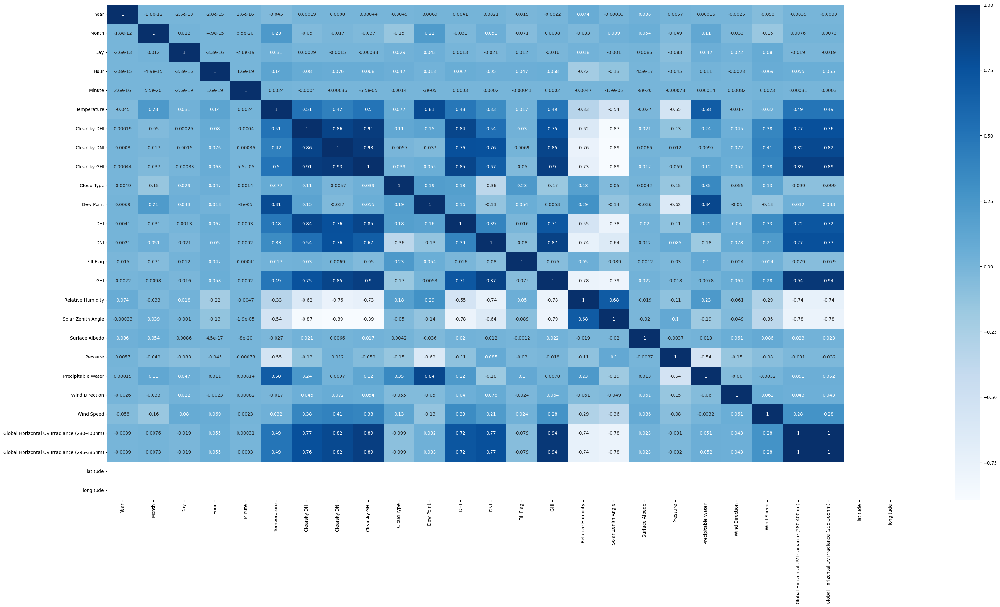

In [ ]:
#look at the correlation
plt.rcParams.update({'font.size':10})
plt.rcParams['figure.figsize'] = 40,20

corr_matrix = dfxselect.corr()
fig1 = sns.heatmap(corr_matrix, annot = True, cmap = 'Blues')

# from google.colab import files
# plt.savefig('MATRIXFULLDATA.png', bbox_inches='tight') 
# files.download("MATRIXFULLDATA.png") 

In [ ]:
#add timestamp to display time series plot
merged_df['Timestamp'] = pd.to_datetime(merged_df[['Year', 'Month', 'Day', 'Hour', 'Minute']])

(array([18262., 18353., 18444., 18536., 18628., 18718., 18809., 18901.,
        18993.]),
 [Text(18262.0, 0, '2020-01'),
  Text(18353.0, 0, '2020-04'),
  Text(18444.0, 0, '2020-07'),
  Text(18536.0, 0, '2020-10'),
  Text(18628.0, 0, '2021-01'),
  Text(18718.0, 0, '2021-04'),
  Text(18809.0, 0, '2021-07'),
  Text(18901.0, 0, '2021-10'),
  Text(18993.0, 0, '2022-01')])

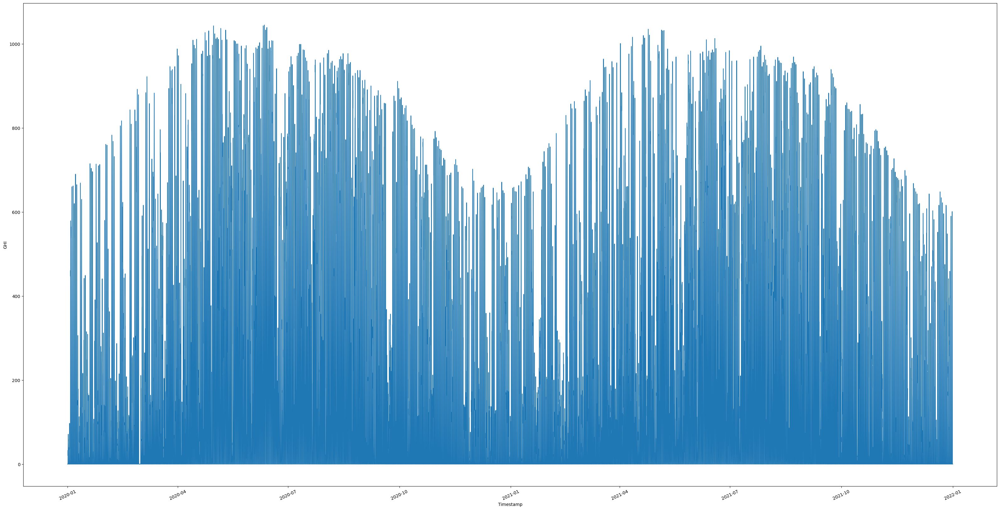

In [ ]:
#GHI timeseries
sns.lineplot(x = "Timestamp", y = "GHI",
             data = merged_df)
  
plt.xticks(rotation = 25)

# from google.colab import files
# plt.savefig('FULLLINE.png', bbox_inches='tight') 
# files.download("FULLLINE.png")

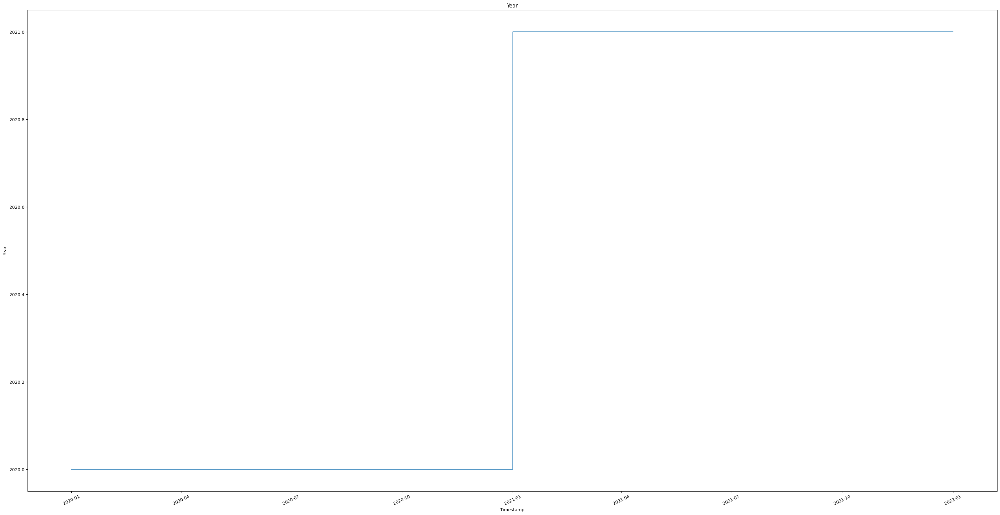

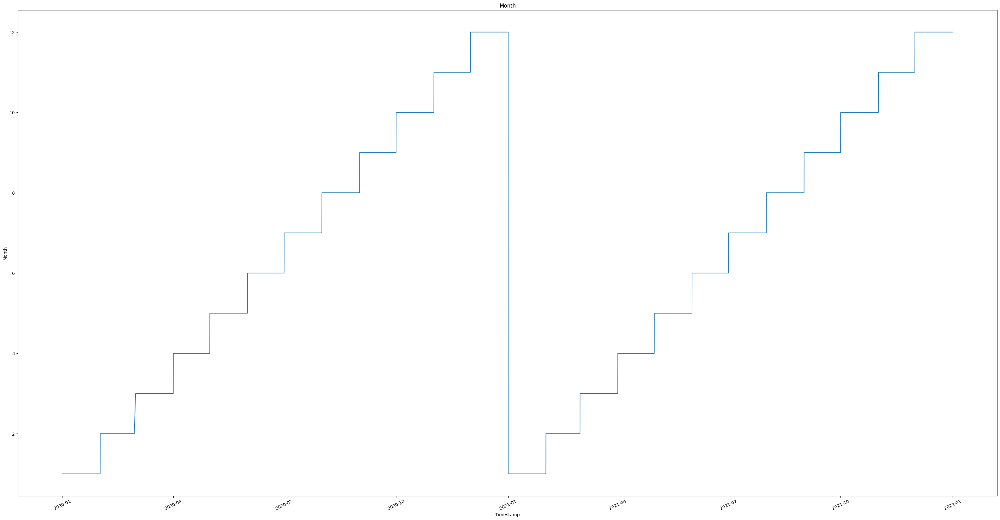

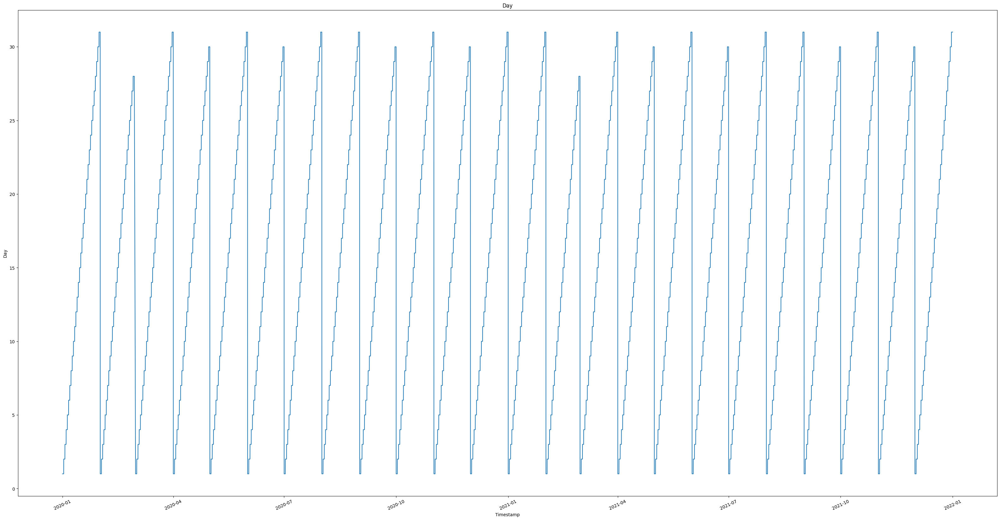

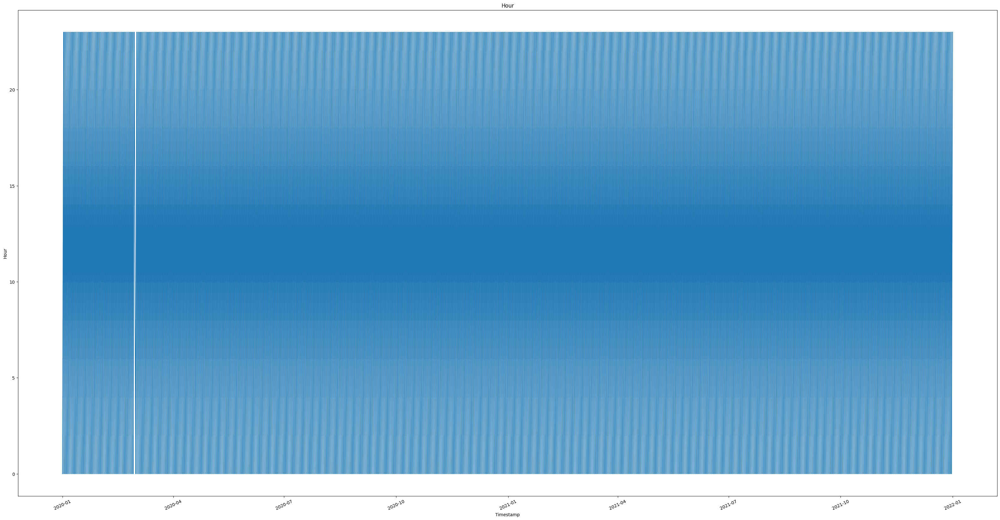

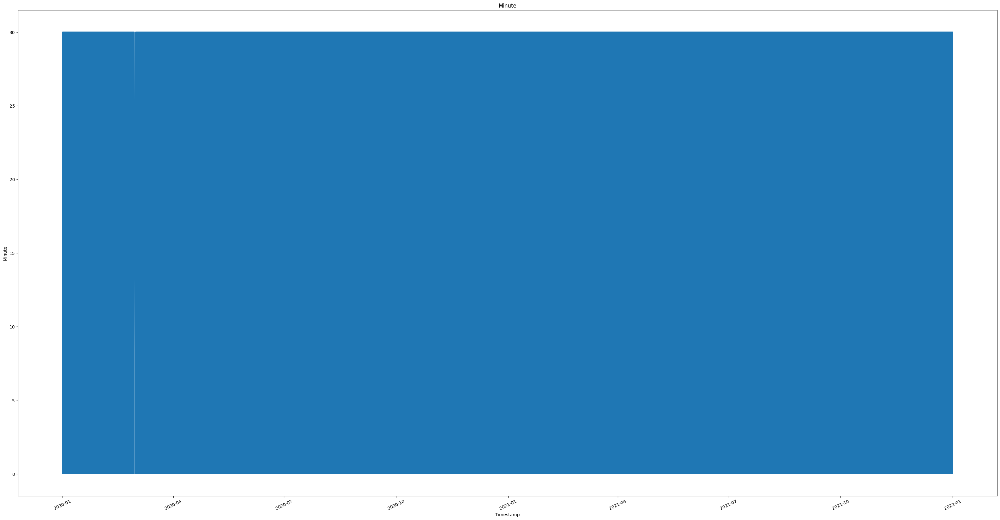

...

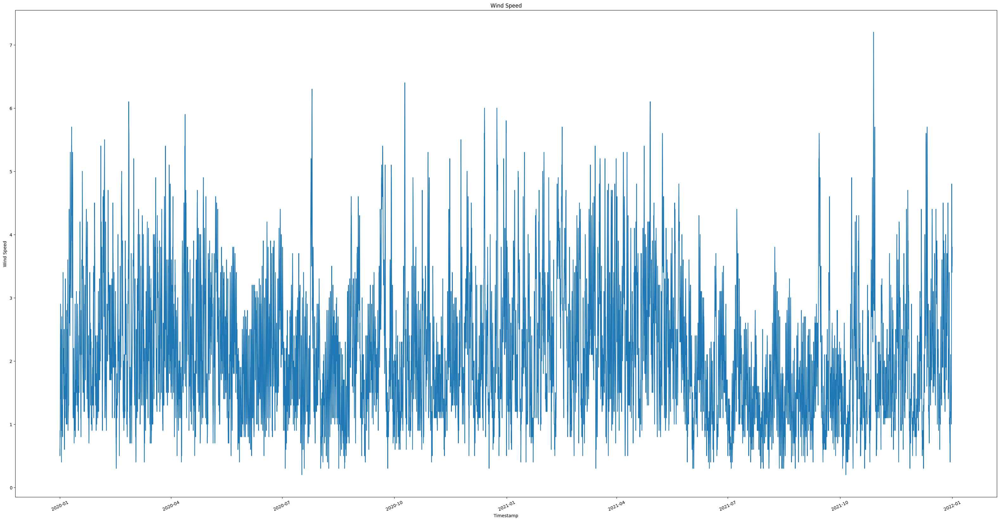

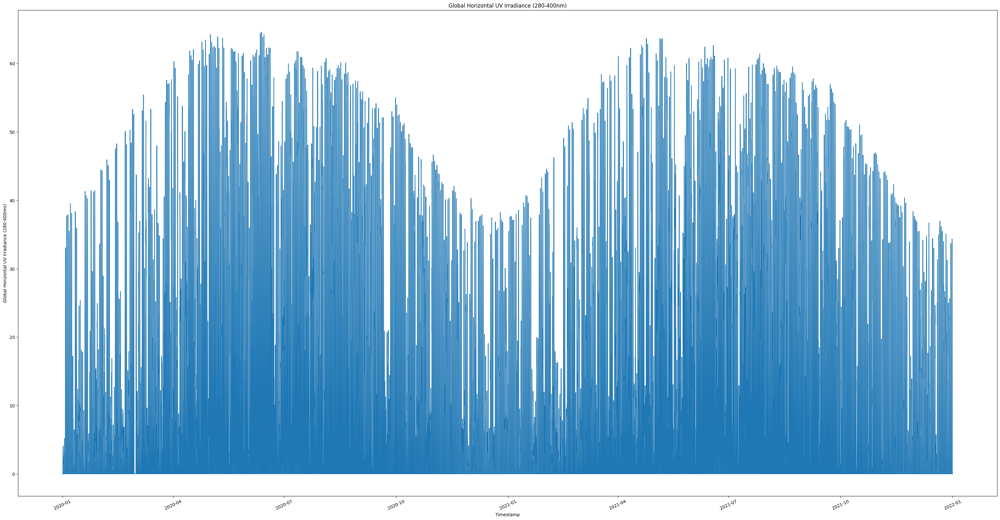

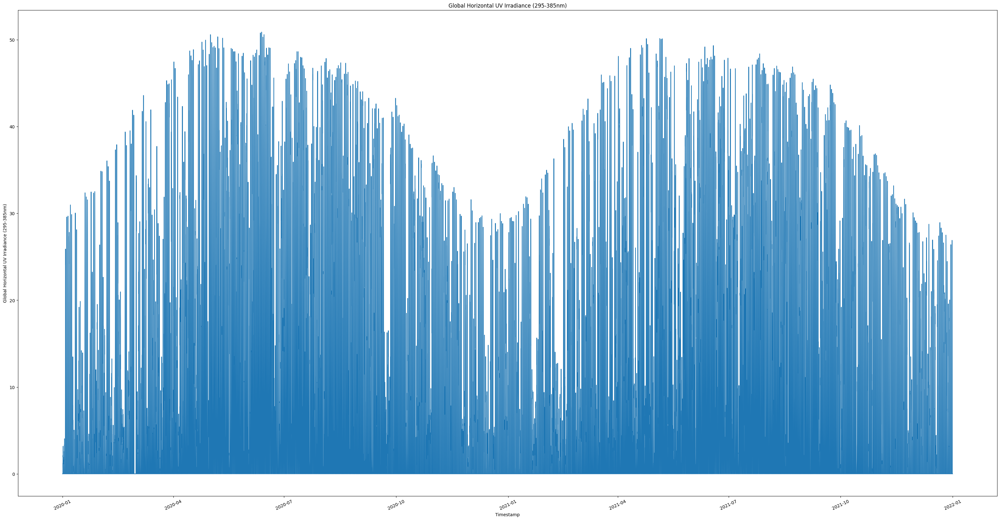

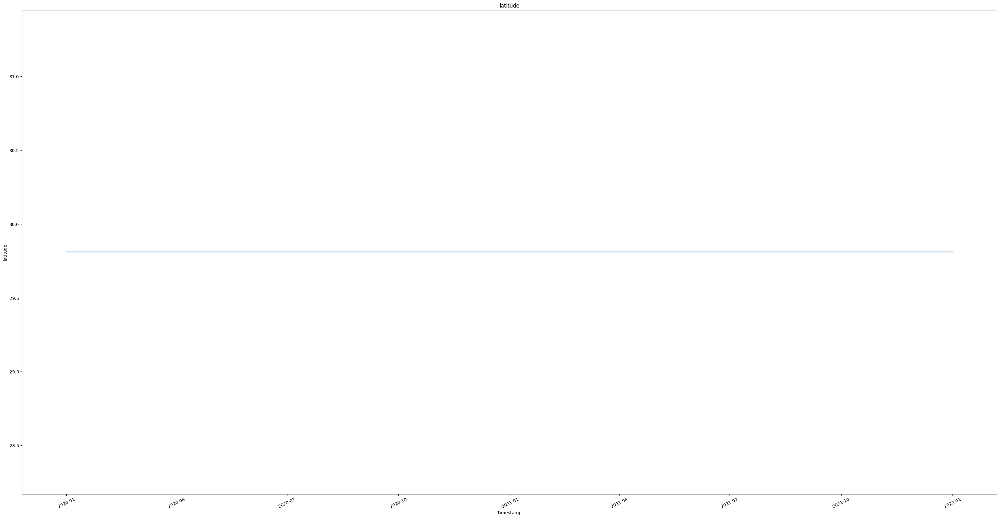

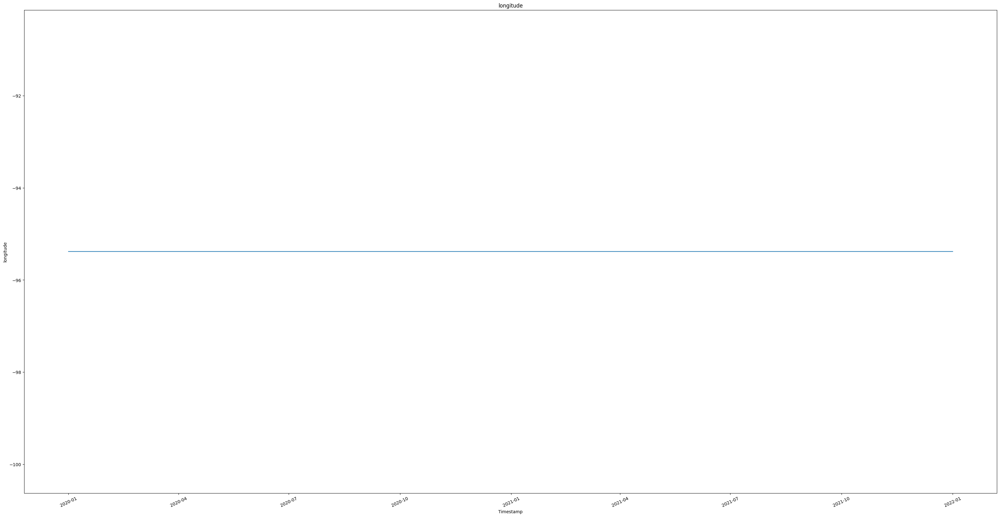

In [ ]:
#display all varibles 
# set the index of the dataframe to the Timestamp column
merged_df.set_index('Timestamp', inplace=True)

# iterate through the feature names and create a separate line plot for each feature
for feature in dfxselect.columns:
    sns.lineplot(data=dfxselect[feature])
    plt.xticks(rotation=25)
    plt.title(feature)
    plt.show()


In [ ]:
#select rows for ML LSTM model
modeldf = merged_df[['Month', 'Day', 'Hour', 'Minute','Temperature', 'Relative Humidity', 'Solar Zenith Angle', 'Wind Speed', 'GHI']]

In [ ]:
#ensure data type is float
modeldf.dtypes

Month                 float64
Day                   float64
Hour                  float64
Minute                float64
Temperature           float64
Relative Humidity     float64
Solar Zenith Angle    float64
Wind Speed            float64
GHI                   float64
dtype: object

In [ ]:
#Check for missing values
print(modeldf.isna().any())


Month                 False
Day                   False
Hour                  False
Minute                False
Temperature           False
Relative Humidity     False
Solar Zenith Angle    False
Wind Speed            False
GHI                   False
dtype: bool


In [ ]:
#display
modeldf

,Month,Day,Hour,Minute,Temperature,Relative Humidity,Solar Zenith Angle,Wind Speed,GHI
Timestamp,,,,,,,,,
2021-01-01 00:00:00,1.0,1.0,0.0,0.0,5.9,84.23,171.17,3.9,0.0
2021-01-01 00:30:00,1.0,1.0,0.0,30.0,5.6,86.00,173.09,3.9,0.0
2021-01-01 01:00:00,1.0,1.0,1.0,0.0,5.3,83.24,169.62,3.9,0.0
2021-01-01 01:30:00,1.0,1.0,1.0,30.0,4.9,85.58,163.96,3.8,0.0
2021-01-01 02:00:00,1.0,1.0,2.0,0.0,4.6,83.59,157.72,3.7,0.0
...,...,...,...,...,...,...,...,...,...
2020-12-31 21:30:00,12.0,31.0,21.0,30.0,11.0,46.59,140.56,0.6,0.0
2020-12-31 22:00:00,12.0,31.0,22.0,0.0,10.7,48.43,147.06,0.6,0.0
2020-12-31 22:30:00,12.0,31.0,22.0,30.0,10.5,49.08,153.54,0.6,0.0


In [ ]:
#replace with your path in your drive
modeldf.to_csv('YOURFILEPATH_Modeldata.csv')


In [ ]:
#get the data into a useable form for model
from math import sqrt
from numpy import concatenate
from matplotlib import pyplot
from pandas import read_csv
from pandas import DataFrame
from pandas import concat
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
 
# convert series to supervised learning
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	modeldf = DataFrame(data)
	cols, names = list(), list()
	# input sequence (t-n, ... t-1)
	for i in range(n_in, 0, -10):
		cols.append(modeldf.shift(i))
		names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
	# forecast sequence (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(modeldf.shift(-i))
		if i == 0:
			names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
		else:
			names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
	# put it all together
	agg = concat(cols, axis=1)
	agg.columns = names
	# drop rows with NaN values
	if dropnan:
		agg.dropna(inplace=True)
	return agg
 

dataset = pd.read_csv('YOURFILEPATH_Modeldata.csv')
values = dataset.iloc[:, 1:].values  # exclude first column (time stamp)

# integer encode direction
encoder = LabelEncoder()
values[:,4] = encoder.fit_transform(values[:,4])

# ensure all data is float
values = values.astype('float32')

# normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)



In [ ]:
# frame as supervised learning
reframed = series_to_supervised(scaled, 1, 1)

reframed

,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var8(t-1),var9(t-1),var1(t),var2(t),var3(t),var4(t),var5(t),var6(t),var7(t),var8(t),var9(t)
1,0.0,0.0,0.000000,0.0,0.299569,0.814863,0.987169,0.528571,0.0,0.0,0.0,0.000000,1.0,0.293103,0.835642,0.998681,0.528571,0.0
2,0.0,0.0,0.000000,1.0,0.293103,0.835642,0.998681,0.528571,0.0,0.0,0.0,0.043478,0.0,0.286638,0.803240,0.977875,0.528571,0.0
3,0.0,0.0,0.043478,0.0,0.286638,0.803240,0.977875,0.528571,0.0,0.0,0.0,0.043478,1.0,0.278017,0.830711,0.943938,0.514286,0.0
4,0.0,0.0,0.043478,1.0,0.278017,0.830711,0.943938,0.514286,0.0,0.0,0.0,0.086957,0.0,0.271552,0.807349,0.906524,0.500000,0.0
5,0.0,0.0,0.086957,0.0,0.271552,0.807349,0.906524,0.500000,0.0,0.0,0.0,0.086957,1.0,0.267241,0.822141,0.868030,0.485714,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35035,1.0,1.0,0.913043,0.0,0.415948,0.362292,0.764660,0.042857,0.0,1.0,1.0,0.913043,1.0,0.409483,0.372975,0.803634,0.057143,0.0
35036,1.0,1.0,0.913043,1.0,0.409483,0.372975,0.803634,0.057143,0.0,1.0,1.0,0.956522,0.0,0.403017,0.394576,0.842607,0.057143,0.0
35037,1.0,1.0,0.956522,0.0,0.403017,0.394576,0.842607,0.057143,0.0,1.0,1.0,0.956522,1.0,0.398707,0.402207,0.881461,0.057143,0.0
35038,1.0,1.0,0.956522,1.0,0.398707,0.402207,0.881461,0.057143,0.0,1.0,1.0,1.000000,0.0,0.396552,0.403851,0.919715,0.057143,0.0


In [ ]:
#check shape
reframed.shape

(35039, 18)

In [ ]:
# drop columns we don't want to predict
reframed.drop(reframed.columns[[0,1,2,3,4,5,6,7]], axis=1, inplace=True)
print(reframed.head())

   var9(t-1)  var1(t)  var2(t)   var3(t)  var4(t)   var5(t)   var6(t)  \
1        0.0      0.0      0.0  0.000000      1.0  0.293103  0.835642   
2        0.0      0.0      0.0  0.043478      0.0  0.286638  0.803240   
3        0.0      0.0      0.0  0.043478      1.0  0.278017  0.830711   
4        0.0      0.0      0.0  0.086957      0.0  0.271552  0.807349   
5        0.0      0.0      0.0  0.086957      1.0  0.267241  0.822141   

    var7(t)   var8(t)  var9(t)  
1  0.998681  0.528571      0.0  
2  0.977875  0.528571      0.0  
3  0.943938  0.514286      0.0  
4  0.906524  0.500000      0.0  
5  0.868030  0.485714      0.0  


In [ ]:
# split into train and test sets
values = reframed.values
split_threshold = int(0.7 * len(values))
train = values[:split_threshold, :]
test = values[split_threshold:, :]

# split into input and outputs
train_X, train_y = train[:, :-1], train[:, -1]
test_X, test_y = test[:, :-1], test[:, -1]

# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))

print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)


(24527, 1, 9) (24527,) (10512, 1, 9) (10512,)


Epoch 1/50
341/341 - 4s - loss: 0.0766 - val_loss: 0.0443 - 4s/epoch - 13ms/step
Epoch 2/50
341/341 - 1s - loss: 0.0389 - val_loss: 0.0398 - 1s/epoch - 4ms/step
Epoch 3/50
341/341 - 1s - loss: 0.0366 - val_loss: 0.0358 - 1s/epoch - 3ms/step
Epoch 4/50
341/341 - 1s - loss: 0.0334 - val_loss: 0.0396 - 1s/epoch - 3ms/step
Epoch 5/50
341/341 - 1s - loss: 0.0321 - val_loss: 0.0357 - 1s/epoch - 4ms/step
Epoch 6/50
341/341 - 1s - loss: 0.0308 - val_loss: 0.0318 - 1s/epoch - 4ms/step
Epoch 7/50
341/341 - 2s - loss: 0.0298 - val_loss: 0.0296 - 2s/epoch - 5ms/step
Epoch 8/50
341/341 - 2s - loss: 0.0283 - val_loss: 0.0287 - 2s/epoch - 5ms/step
Epoch 9/50
341/341 - 1s - loss: 0.0274 - val_loss: 0.0275 - 1s/epoch - 4ms/step
Epoch 10/50
341/341 - 1s - loss: 0.0262 - val_loss: 0.0261 - 1s/epoch - 4ms/step
Epoch 11/50
341/341 - 1s - loss: 0.0253 - val_loss: 0.0257 - 1s/epoch - 4ms/step
Epoch 12/50
341/341 - 1s - loss: 0.0252 - val_loss: 0.0253 - 1s/epoch - 3ms/step
Epoch 13/50
341/341 - 1s - loss: 0.0

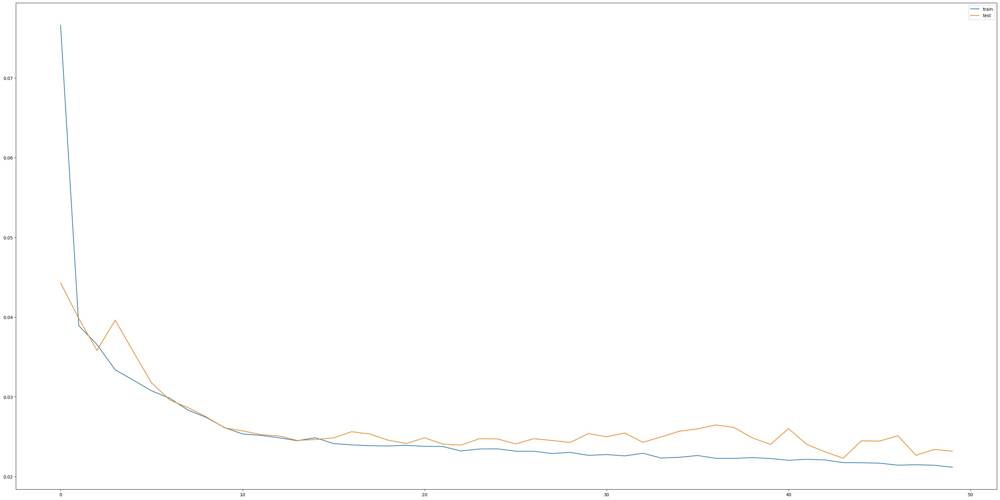

329/329 [==============================] - 1s 2ms/step
Test RMSE: 0.510


In [ ]:
#run model
# design network
model = Sequential()
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')
# fit network
history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False)
# plot history
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()
pyplot.show()
 
# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)
#save model
model.save("my_model.h5")


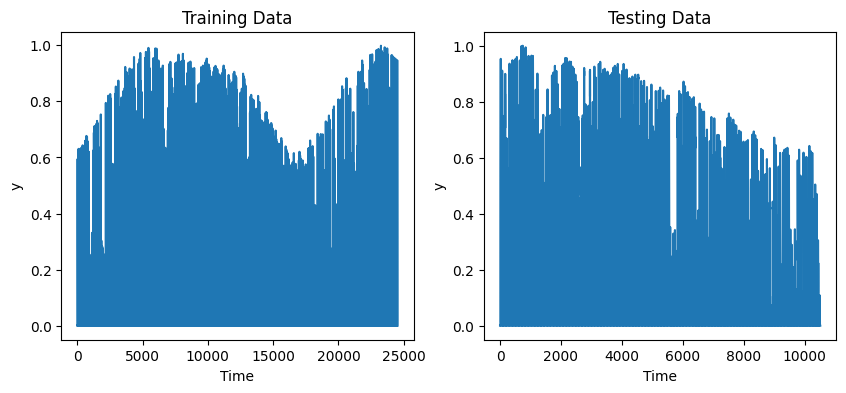

In [ ]:
#In this code, we first create a new figure with a size of 10 inches by 4 inches using the figure() function. Then, we use the subplot() function to create two subplots: one on the left-hand side (subplot 1) and one on the right-hand side (subplot 2) of the figure. The subplot() function takes three arguments: the number of rows, the number of columns, and the index of the current subplot. In this case, we have one row with two columns, so we set the arguments to subplot(1, 2, 1) for the left-hand subplot and subplot(1, 2, 2) for the right-hand subplot.
#In each subplot, we use the plot() function to plot the data (train_y in subplot 1 and test_y in subplot 2) and add a title, x-axis label, and y-axis label with the title(), xlabel(), and ylabel() functions, respectively.
#Finally, we use the show() function to display the figure with both subplots side by side.

# plot baseline and predictions
plt.figure(figsize=(10, 4)) # set the size of the figure
plt.subplot(1, 2, 1) # create the first subplot
plt.plot(train_y)
plt.title('Training Data')
plt.xlabel('Time')
plt.ylabel('y')
plt.subplot(1, 2, 2) # create the second subplot
plt.plot(test_y)
plt.title('Testing Data')
plt.xlabel('Time')
plt.ylabel('y')
plt.show()


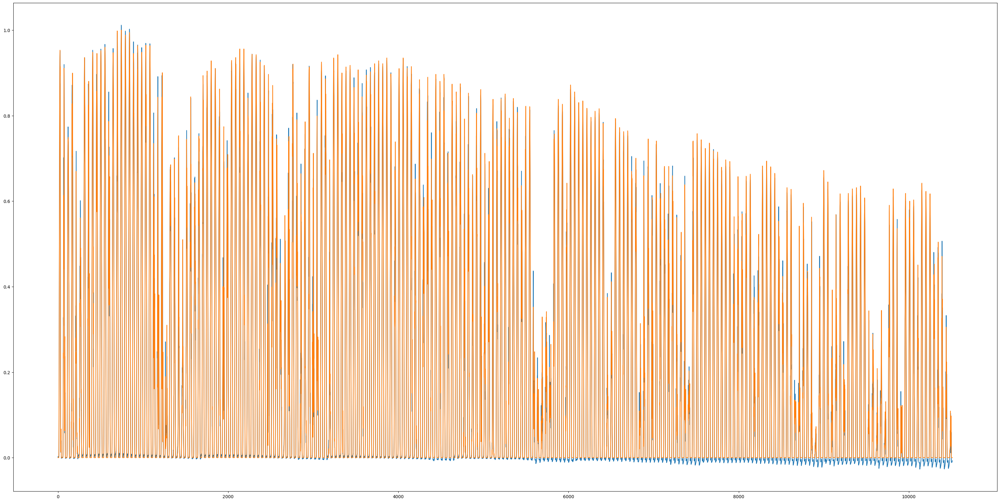

In [ ]:
#evaluate predictions of model
plt.figure()
plt.plot(yhat)
plt.plot(test_y)
plt.legend
plt.show()

In [ ]:
#create a function to plot below
Ghi = modeldf[['GHI']]

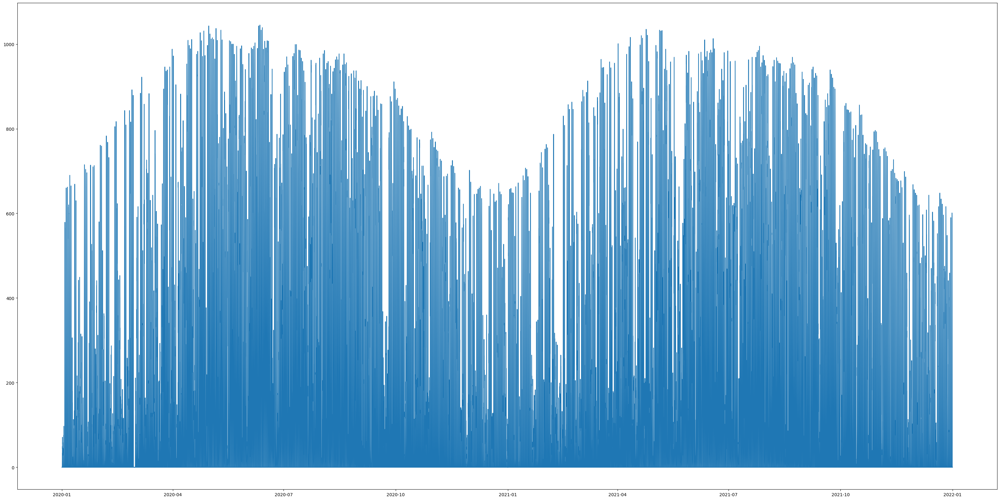

In [ ]:
#look into data
plt.plot(Ghi)

plt.legend
plt.show()

In [ ]:
# Extract model for use in predicting GHI

In [ ]:
#Refrence what the model was fed modeldf = merged_df[['Month', 'Day', 'Hour', 'Minute','Temperature', 'Relative Humidity', 'Solar Zenith Angle', 'Wind Speed', 'GHI']]

In [ ]:
#display data before prediction
Finaldf

,Temperature,Humidity,Description,Wind Speed,Solar Zenith Angle,latitude,longitude,Month,Day,Hour,Minute,Elevation,Altitude
0,25.25,65,clear sky,4.63,94.49554,29.810226,-95.381617,5,2,1,16,20.0,-0.332963


In [ ]:
#Make prediction
from keras.models import load_model

# load the saved model
model = load_model("my_model.h5")

# load the new data
row_index = 0 # or any other integer value

new_data = pd.DataFrame({'Temperature': [Finaldf.loc[row_index, 'Temperature']],
                         'Humidity': [Finaldf.loc[row_index, 'Humidity']],
                         'Wind Speed': [Finaldf.loc[row_index, 'Wind Speed']],
                         'Solar Zenith Angle': [Finaldf.loc[row_index, 'Solar Zenith Angle']],
                         'GHI': [50.0],
                         'Month': [Finaldf.loc[row_index, 'Month']],
                         'Day': [Finaldf.loc[row_index, 'Day']],
                         'Hour': [Finaldf.loc[row_index, 'Hour']],
                         'Minute': [Finaldf.loc[row_index, 'Minute']]
                         })

# scale the new data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(new_data)

# reshape the data to match the input shape of the model
input_data = scaled_data.reshape((scaled_data.shape[0], 1, scaled_data.shape[1]))

# make the prediction
prediction = model.predict(input_data)

# invert the scaling of the prediction
inv_prediction = scaler.inverse_transform(np.concatenate((prediction, scaled_data[:, 1:]), axis=1))
inv_prediction = inv_prediction[:,0]

# Save Predictions to a new column in Finaldf
Finaldf['Predicted_GHI'] = pd.Series(inv_prediction[0])
print("The predicted GHI value is:", inv_prediction[0])


1/1 [==============================] - 1s 509ms/step
The predicted GHI value is: 25.325571224093437


In [ ]:
#display data
Finaldf

,Temperature,Humidity,Description,Wind Speed,Solar Zenith Angle,latitude,longitude,Month,Day,Hour,Minute,Elevation,Altitude,Predicted_GHI
0,25.25,65,clear sky,4.63,94.49554,29.810226,-95.381617,5,2,1,16,20.0,-0.332963,25.325571


COMFA & COMFAcourtyard

The standard ASHRAE formula for calculating the mean radiant temperature is defined in the ASHRAE Standard 55-2017: Thermal Environmental Conditions for Human Occupancy. The formula can be found in section 5.3.2 of the standard, which is titled "Mean Radiant Temperature".
https://www.ashrae.org/technical-resources/bookstore/standard-55-thermal-environmental-conditions-for-human-occupancy

Alternatively, you can also find the formula in many textbooks and research papers related to thermal comfort and building science.

In [ ]:
#Standard ASHRAE formula is commonly used in the field of building science and thermal comfort analysis. However, it is important to note that this formula assumes certain conditions, such as the absence of direct solar radiation and the assumption of uniform thermal radiation exchange between all surfaces.

In [ ]:
# Calculate the mean radiant temperature Using ASHRAE standard equation
#The formula used to calculate the mean radiant temperature is the standard ASHRAE formula, which is commonly used in the field of building science and thermal comfort analysis. However, it is important to note that this formula assumes certain conditions, such as the absence of direct solar radiation and the assumption of uniform thermal radiation exchange between all surfaces.
air_temp = Finaldf['Temperature'] #C
rel_humidity = Finaldf['Humidity'] / 100.0 #%
wind_speed_kmh = Finaldf['Wind Speed'] #m/s
solar_radiation = 0  # OpenWeatherMap API does not provide solar radiation data

mean_radiant_temp = 0.5 * (air_temp + 21.111) + 0.25 * (air_temp - 14.444) * (1.0 - rel_humidity) - 0.474 * wind_speed_kmh + 0.92 * (air_temp - 14.444) - 17.8

print(f"Mean radiant temperature: {mean_radiant_temp} °C")
# Finaldf['MRT'] = mean_radiant_temp


Mean radiant temperature: 0    14.072925
dtype: float64 °C


The last term of the equation + 0.1 * ghi adds the effect of solar radiation on the mean radiant temperature using the GHI value.

Note that the accuracy of the calculation will depend on the accuracy of the GHI data used as input. GHI is a measure of the total amount of solar radiation received on a horizontal surface, and it may not be representative of the actual solar radiation received on the human body. However, it is a commonly used parameter in solar energy studies and can provide a useful estimate of the impact of solar radiation on thermal comfort.

In [ ]:
# Calculate the estimate of mean radiant temperature Consider soalr radiation - Notice the diffrence from the above which does not consider solar radiation absored by an idvidual
#It is important to note that the accuracy of the calculation will depend on the accuracy of the solar radiation data used as input. Additionally, the formula assumes that the solar radiation is uniformly distributed on all surfaces, which may not always be the case in practice.
# Uniform Solar radiation is assumed however, this would not always be the case in an urban environment where mnay factors including geomotry create diffrent radiation levels in various spaces. Future work needs to explore this further.
air_temp = Finaldf['Temperature'] #C
rel_humidity = Finaldf['Humidity'] / 100.0 #%
wind_speed_kmh = Finaldf['Wind Speed'] #m/s
ghi = Finaldf['Predicted_GHI']  # Global Horizontal Irradiance, in W/m^2

mean_radiant_temp = 0.5 * (air_temp + 21.111) + 0.25 * (air_temp - 14.444) * (1.0 - rel_humidity) - 0.474 * wind_speed_kmh + 0.92 * (air_temp - 14.444) - 17.8 + 0.1 * ghi

print(f"Mean radiant temperature: {mean_radiant_temp} °C")
Finaldf['MRT'] = mean_radiant_temp


Mean radiant temperature: 0    16.605482
dtype: float64 °C


COMFA

In [ ]:
#To avoid zeroed values
Finaldf.loc[Finaldf['Wind Speed'] == 0, 'Wind Speed'] = 0.1

In [ ]:
import math

Source:
https://github.com/RenzhiWuSCUT/OutdoorThermalComfortModel-PET-SET-UTCI-WBGT-COMFA-and-COMFAcourtyard/blob/main/OutdoorThermalComfortModel.py


-------------Wu, R., Fang Xiaoshan, Brown, R.D., Liu, S. and Zhao, H. (2023). The COMFA model for assessing courtyard thermal comfort in hot and humid regions: A comparative study with existing models. Building and Environment, [online] 234, pp.110150–110150. doi:https://doi.org/10.1016/j.buildenv.2023.110150.

‌

In [ ]:
#define parameters - you could chnage these 
# Parameters 参数:
        # tAirC : float : Air temperature [℃]. 空气温度[℃]。
        # ksolar : float : Solar radiation (or Global horizontal irradiance, GHI) [W/m2]. 太阳辐射[W/m2] (或全球水平辐照度GHI)。
        # vAir : float : Air velocity [m/s]. 风速[m/s]。
        # rh : float : Relative humidity [%]. 相对湿度[%]。
        # height_m : float : Height of the person [m]. 身高[m]。
        # weight_kg : float : Weight of the person [kg]. 体重[kg]。
        # rcl_clo : float : Clothing insulation [clo]. 服装热阻[clo]。
        # Ma : float : Metabolic rate [W/m2]. 新陈代谢率[W/m2]。
        # sex : Union[int, str] : Sex of the person. 1 for male, 2 for female. 性别，1或'male'为男性，2或 'female'为女性。
        # age : int : Age [years]. 年龄[岁]。
        # alt : float : Solar altitude angle [deg]. 太阳高度角[°]。
        # beam : float : Solar beam fraction [−]. 直射辐射透过率[−]。
        # SVF : float : Sky View Factor [−]. 天空角系数[−]。
        #    Returns 返回值:
        # Q_Balance: float: Energy balance budget (COMFAcourtyard) [W/m2]. COMFA[W/m2]。
        # Q_Meta: float: Metabolic heat production [W/m2]. 代谢产热量[W/m2]。
        # Q_Rad: float: Radiation absorption heat [W/m2]. 辐射吸收热量[W/m2]。
        # Q_Conv: float: Convective heat dissipation [W/m2]. 对流散热[W/m2]。
        # Q_Evap: float: Evaporative heat dissipation [W/m2]. 蒸发散热[W/m2]。
        # Q_L: float: Longwave emission heat [W/m2]. 长波发射热量 [W/m2]。
        # level: int: Thermal comfort level [-]. 热舒适级别 [-]。
#####Parameters could be altered

tAirC = Finaldf['Temperature']
ksolar = Finaldf['Predicted_GHI']
vAir = Finaldf['Wind Speed']
rh = Finaldf['Humidity']
height_m = 1.75
weight_kg = 100
rcl_clo = 0.5
Ma = 150.0 
sex = 1 
age = 35
alt = Finaldf['Altitude']
beam = 1.0
SVF = 1.0


In [ ]:
#COMFA
def cal_COMFA(tAirC=28.0, ksolar=100.0, vAir=5.0, rh=60.0,
                  height_m=1.8, weight_kg=78, rcl_clo=0.264, Ma=116.0, sex=1, age=38,
                  alt=40.0, beam=1.0, SVF=1.0):

        def clo2sm(clo):
            rclKMn2Wn1 = 0.155 * clo
            rSnCM = rclKMn2Wn1 / 0.082
            rSnM = rSnCM * 100.0
            return rSnM

        def calRad(SVF, alt, beam, kSolar, tAirK):
            ## Purpose【albedo】
            albedoCo = 37 / 100;
            difFrac = 10.0
            albedoSky = 0.0
            albedoGnd = 25.0
            DHI = (difFrac * kSolar / 100)
            difFracPercent = difFrac / 100
            RadianConvert = 0.017453293
            altRad = alt * RadianConvert
            K_Flt = ((1 - difFracPercent) * kSolar) / math.tan(altRad)
            K_Cyl = K_Flt / 3.141592654
            albedoGndPercent = albedoGnd / 100
            pi = 3.14
            L_Ref = (((kSolar * beam * albedoGndPercent) / 2) + ((kSolar * beam * albedoSky / 100) / 2 / pi))
            K_Abs = (((K_Cyl * beam) + (SVF * DHI) + DHI * (1 - SVF) * albedoSky) + (L_Ref)) * (1 - albedoCo)
            L_Sky = (1.2 * (5.67E-8 * (tAirK ** 4))) - 171
            L_Wall = 0.98 * (5.67E-8 * (tAirK ** 4)) * (1 - SVF)
            L_Gnd = 0.98 * (5.67E-8 * (tAirK ** 4))
            L_Abs = (((L_Wall + (SVF * L_Sky)) * 0.5) + (L_Gnd * 0.5)) * 0.98
            R_Abs = (K_Abs + L_Abs) * 0.8
            return R_Abs

        vActivity = 0.0
        sex = 1 if sex < 1.5 else 2
        if sex == 1:
            rmr = 10 * weight_kg + 6.25 * height_m * 100 - 5 * age + 5
        else:
            rmr = 9.99 * weight_kg + 6.25 * height_m * 100 - 4.92 * age - 161
        Watt = rmr / 24 * 1.163
        facActivity = Ma / 80.0
        Ma = Watt * facActivity

        # Purpose: temperature and radiance
        tAirK = tAirC + 273.15
        kSolar = ksolar
        # Purpose: clothing
        rCoStatic = clo2sm(rcl_clo);
        rCoVaporStatic = rCoStatic * 2.74524064171123;
        vRelative = 1.92
        rCoVapor = rCoVaporStatic * (-0.8 * (1 - math.exp(-vRelative / 1.095)) + 1);
        rClo = rCoStatic * (-0.37 * (1 - math.exp(-vActivity / 0.72)) + 1)  # 50

        # Rabs
        R_Abs = calRad(SVF, alt, beam, kSolar, tAirK)

        # Metabolism
        rhPercent = rh / 100
        evap = ((0.6108 * (math.exp((17.269 * tAirC) / (tAirC + 237.3)))) * rhPercent)
        f_Latent = (0.15 - (0.0173 * evap) - (0.0014 * tAirC))
        Q_Meta = (1 - f_Latent) * Ma

        # Purpose【Tc】
        tCoreC = 36.5 + ((0.0043) * Q_Meta)

        # Purpose【Tsk】
        ReNumber = 11333 * vAir
        if ReNumber >= 40000:
            rAerodynamic = (0.17 / ((0.71 ** 0.33) * 0.000022 * 0.0266 * (ReNumber ** 0.805)))
        elif ReNumber >= 4000 and ReNumber < 40000:
            rAerodynamic = (0.17 / ((0.71 ** 0.33) * 0.000022 * 0.683 * (ReNumber ** 0.466)))
        else:
            rAerodynamic = (0.17 / ((0.71 ** 0.33) * 0.000022 * 0.193 * (ReNumber ** 0.618)))
        eSweat = 0.42 * (Q_Meta - 58)
        cAir = 1212.
        rTissue = cAir / (0.13 * eSweat + 15)
        tSkinC = (((tCoreC - tAirC) / (rTissue + rClo + rAerodynamic)) * (rAerodynamic + rClo)) + tAirC

        # CONV
        Q_Conv = cAir * ((tSkinC - tAirC) / (rClo + rAerodynamic))
        # Tsf
        tSrfC = ((tSkinC - tAirC) / (rClo + rAerodynamic)) * rAerodynamic + tAirC
        # L
        Q_L = 0.75 * ((0.95 * 5.67E-8) * ((tSrfC + 273) ** 4))
        # qs
        qSkin = 0.6108 * (math.exp((17.269 * tSkinC) / (tSkinC + 237.3)))

        # Evap
        pLv = (1.16 * 2442)
        qAir = evap
        rAerodynamicVapor = (0.92 * rAerodynamic)
        rTissueVapor = 7700
        eDiffusion = pLv * (qSkin - qAir) / (rCoVapor + rAerodynamicVapor + rTissueVapor)
        eMax = pLv * ((qSkin - qAir) / (rCoVapor + rAerodynamicVapor))
        eSweat = 0.42 * (Q_Meta - 58)
        Q_Evap = eSweat + eDiffusion
        if eMax <= Q_Evap:  Q_Evap = eMax

        Q_Rad = R_Abs
        Q_Balance = Q_Meta + Q_Rad - Q_Conv - Q_Evap - Q_L
        return Q_Balance, Q_Meta, Q_Rad, -Q_Conv, - Q_Evap, - Q_L
Finaldf[['COMFA_Q_Balance', 'COMFA_Q_Meta', 'COMFA_Q_Rad', 'COMFA_Q_Conv', 'COMFA_Q_Evap', 'COMFA_Q_L']] = Finaldf.apply(
    lambda row: pd.Series(cal_COMFA(tAirC=row['Temperature'], ksolar=row['Predicted_GHI'], vAir=row['Wind Speed'], rh=row['Humidity'], height_m=height_m, weight_kg=weight_kg, rcl_clo=rcl_clo, Ma=Ma, sex=sex, age=age, alt=row['Altitude'], beam=beam, SVF=SVF)), 
    axis=1
)


COMFAcourtyard

In [ ]:
# define parameters
  #  Parameters 参数:
        # tAir_C : float : Air temperature [℃]. 空气温度[℃]。
        # vAir : float : Air velocity [m/s]. 风速[m/s]。
        # rh : float : Relative humidity [%]. 相对湿度[%]。
        # height_m : float : Height of the person [m]. 身高[m]。
        # weight_kg : float : Weight of the person [kg]. 体重[kg]。
        # rcl_clo : float : Clothing insulation [clo]. 服装热阻[clo]。
        # Q_movement : float : Metabolic rate [W/m2]. 新陈代谢率[W/m2]。
        # sex : Union[int, str] : Sex of the person. 'male' for male, 'female' for female. 性别，'male'为男性，'female'为女性。
        # age : int : Age [years]. 年龄[岁]。
        # tMrt_C : float : Mean radiant temperature [℃]. 平均辐射温度[℃]。
        # bodyPosture : str : Body posture, can be 'standing', 'sitting', 'crouching'. 身体姿势，取值范围为'standing', 'sitting',或 'crouching'。
        # Returns 返回值:
        # Q_Balance: float: Energy balance budget (COMFAcourtyard) [W/m2]. COMFAcourtyard[W/m2]。
        # Q_Meta: float: Metabolic heat production [W/m2]. 代谢产热量[W/m2]。
        # Q_Rad: float: Radiant heat transfer [W/m2]. 辐射换热[W/m2]。
        # Q_Conv: float: Convective heat transfer [W/m2]. 对流换热[W/m2]。
        # Q_Evap: float: Evaporative heat transfer [W/m2]. 蒸发换热[W/m2]。
        # Q_Cond: float: Conductive heat transfer [W/m2]. 导热换热[W/m2]。
        # level: int: thermal comfort level [-]. 热舒适级别 [-]。
#####Parameters could be altered

tAirC = Finaldf['Temperature']
vAir = Finaldf['Wind Speed']
rh = Finaldf['Humidity']
height_m = 1.75
weight_kg = 100
rcl_clo = 0.5
Q_movement = 150.0
sex = 'male' 
age = 35
tMrt_C = Finaldf['MRT']
bodyPosture = 'standing'


In [ ]:
#COMFAcourtyard
def cal_COMFAcourtyard(tAir_C=28.0, vAir=5.0, rh=60.0,
                           height_m=1.8, weight_kg=78, rcl_clo=0.264, Q_movement=116.0, sex='male', age=38,
                           tMrt_C=30.0, bodyPosture='standing'):

        def clo2sm(clo):
            rclKMn2Wn1 = 0.155 * clo
            rSnCM = rclKMn2Wn1 / 0.082
            rSnM = rSnCM * 100.0
            return rSnM

        vActivity = 0.0

        if type(bodyPosture) == int or type(bodyPosture) == float:
            if bodyPosture < 1.5:
                bodyPosture = "sitting"
            elif bodyPosture < 2.5:
                bodyPosture = "standing"
            else:
                bodyPosture = "crouching"

        if type(sex) == int or type(sex) == float:
            sex = 1 if sex < 1.5 else 2
        if sex == 1:
            rateMetaRestOneDay_kCal = 10 * weight_kg + 6.25 * height_m * 100 - 5 * age + 5
        else:
            rateMetaRestOneDay_kCal = 9.99 * weight_kg + 6.25 * height_m * 100 - 4.92 * age - 161
        rateMetaRest_WMn2 = rateMetaRestOneDay_kCal / 24 * 1.163
        facActivity = Q_movement / 80.0
        Q_meta_total = rateMetaRest_WMn2 * facActivity

        rCoStatic = clo2sm(rcl_clo);
        rCoVaporStatic = rCoStatic * 2.74524064171123;
        vRelative = 1.92
        # vRelative = vAir
        rCoVapor = rCoVaporStatic * (-0.8 * (1 - math.exp(-vRelative / 1.095)) + 1);

        # Purpose【rCo】
        rClo = rCoStatic * (-0.37 * (1 - math.exp(-vActivity / 0.72)) + 1)

        # Purpose【M】
        rhPercent = rh / 100
        q_air_ = ((0.6108 * (math.exp((17.269 * tAir_C) / (tAir_C + 237.3)))) * rhPercent)
        friction_latent = (0.15 - (0.0173 * q_air_) - (0.0014 * tAir_C))
        Q_Meta = (1 - friction_latent) * Q_meta_total

        # Purpose【Tc】
        tCoreC = 36.5 + ((0.0043) * Q_Meta)

        # Purpose【Tsk】
        ReNumber = 11333 * vAir
        if ReNumber >= 40000:
            rAerodynamic = (0.17 / ((0.71 ** 0.33) * 0.000022 * 0.0266 * (ReNumber ** 0.805)))
        elif ReNumber >= 4000 and ReNumber < 40000:
            rAerodynamic = (0.17 / ((0.71 ** 0.33) * 0.000022 * 0.683 * (ReNumber ** 0.466)))
        else:
            rAerodynamic = (0.17 / ((0.71 ** 0.33) * 0.000022 * 0.193 * (ReNumber ** 0.618)))
        Q_Sweat = 0.42 * (Q_Meta - 58)
        rTissue = 1212 / (0.13 * Q_Sweat + 15)
        tSkinC = (((tCoreC - tAir_C) / (rTissue + rClo + rAerodynamic)) * (rAerodynamic + rClo)) + tAir_C

        # Purpose【Rabs】
        areaBody = 0.203 * (weight_kg ** 0.425) * (height_m ** 0.725)  # area of the body
        fCloArea = (173.51 * rcl_clo - 2.36 - 100.76 * rcl_clo * rcl_clo + 19.28 * (rcl_clo ** 3)) / 100  # 服装面积系数
        fCloAreaExpansion = 1.15  # 服装交换面积系数
        factor_area_effective_radiation = 0.696  # 辐射有效面积[m2]
        if bodyPosture == "sitting" or bodyPosture == 1:
            factor_area_effective_radiation = 0.696
        elif bodyPosture == "standing" or bodyPosture == 2:
            factor_area_effective_radiation = 0.725
        elif bodyPosture == "crouching" or bodyPosture == 3:
            factor_area_effective_radiation = 0.67
        areaClo = areaBody * fCloArea + areaBody * (fCloAreaExpansion - 1.)  # 服装面积[m2]
        emissivity_lw_sk = 0.877  # 皮肤长波发射率[-]
        emissivity_lw_cl = 0.591  # 衣服长波发射率[-]
        sigma = 5.67 * (10 ** (-8))  # Stefan-Boltzmann常数[W/(m2*K^(-4))]
        area_effect_radiation = areaBody * factor_area_effective_radiation  # 辐射有效面积

        # >>>> tClo
        tCloC = ((tSkinC - tAir_C) / (rClo + rAerodynamic)) * rAerodynamic + tAir_C
        # >>>> radius_difference
        if fCloArea > 1.0:
            fCloArea = 1.0
        rClo = rcl_clo / 6.45 / fCloArea
        ratioHeightCylClo = 1.0
        if rcl_clo >= 2.0:
            ratioHeightCylClo = 1.0
        if rcl_clo > 0.6 and rcl_clo < 2.0:
            ratioHeightCylClo = (height_m - 0.2) / height_m
        if rcl_clo <= 0.6 and rcl_clo > 0.3:
            ratioHeightCylClo = 0.5
        if rcl_clo <= 0.3 and rcl_clo > 0.0:
            ratioHeightCylClo = 0.1
        radius_cyl_outer = areaBody * (fCloAreaExpansion - 1.0 + fCloArea) / (
                6.28 * height_m * ratioHeightCylClo)
        radius_cyl_inner = fCloArea * areaBody / (6.28 * height_m * ratioHeightCylClo)
        radius_difference = radius_cyl_outer - radius_cyl_inner

        # >>>> hCloCond
        hCloCond = 6.28 * height_m * ratioHeightCylClo * radius_difference / (
                rClo * math.log(radius_cyl_outer / radius_cyl_inner) * areaClo)

        # >>>> SET*:hconv
        pBaroHPA = 1013.25
        pBaroAtm = pBaroHPA / 1013.25
        hConv = 3 * (pBaroAtm ** (0.53))
        if ((Q_movement / 58.2) < 0.85):
            hConvActivity = 0
        else:
            hConvActivity = 5.66 * ((((Q_movement / 58.2) - 0.85) * pBaroAtm) ** 0.39)
        hConvVelocity = 8.600001 * ((vAir * pBaroAtm) ** 0.53)
        if (hConv <= hConvActivity):    hConv = hConvActivity
        if (hConv < hConvVelocity):    hConv = hConvVelocity

        # >>>> tCloDelta
        hConvSkin = 1212 / (rAerodynamic)
        # >>>> >>>> Q_conv_clo
        QQ_conv_clo = hConv * (tAir_C - tCloC) * factor_area_effective_radiation * areaClo
        # >>>> >>>> Q_rad_clo
        QQ_rad_clo = factor_area_effective_radiation * areaClo * emissivity_lw_cl * sigma * (
                ((tMrt_C + 273.2) ** 4) - ((tCloC + 273.2) ** 4))
        hRadLinear = 4 * sigma * (((tCloC + tMrt_C) / 2 + 273.15) ** 3) * 0.72
        tCloDelta = (QQ_rad_clo / hRadLinear + QQ_conv_clo / hConv) / areaBody
        # >>>> Q_Cond
        Q_Cond = hCloCond * ((tCloDelta + tCloC) - tSkinC)
        # >>>> Q_Conv
        QQ_conv_bare = - hConv * (tAir_C - tSkinC) * areaBody * (1. - fCloArea)
        Q_Conv = QQ_conv_bare / areaBody
        # >>>> Q_Rad
        QQ_rad_bare = area_effect_radiation * (1. - fCloArea) * emissivity_lw_sk * sigma * (
                ((tMrt_C + 273.2) ** 4) - ((tSkinC + 273.2) ** 4))
        Q_Rad = QQ_rad_bare / areaBody

        # qs
        qSkin = 0.6108 * (math.exp((17.269 * tSkinC) / (tSkinC + 237.3)))
        # Y
        pLv = (1.16 * 2442)
        qAir = q_air_
        rAerodynamicVapor = (0.92 * rAerodynamic)
        rTissueVapor = 7700
        Q_Diffusion = pLv * (qSkin - qAir) / (rCoVapor + rAerodynamicVapor + rTissueVapor)
        eMax = pLv * ((qSkin - qAir) / (rCoVapor + rAerodynamicVapor))
        Q_Sweat = 0.42 * (Q_Meta - 58)
        Q_Evap = Q_Sweat + Q_Diffusion
        if eMax <= Q_Evap:  Q_Evap = eMax

        Q_Balance = Q_Meta + Q_Rad - Q_Conv - Q_Evap + Q_Cond
        return (Q_Balance, Q_Meta, Q_Rad, - Q_Conv, - Q_Evap, Q_Cond)
Finaldf[['COMFAcourtyard_Q_Balance', 'COMFAcourtyard_Q_Meta', 'COMFAcourtyard_Q_Rad', 'COMFAcourtyard_Q_Conv', 'COMFAcourtyard_Q_Evap', 'COMFAcourtyard_Q_Cond']] = Finaldf.apply(lambda row: cal_COMFAcourtyard(tAir_C=row['Temperature'], vAir=row['Wind Speed'], rh=row['Humidity'], height_m=height_m, weight_kg=weight_kg, rcl_clo=rcl_clo, Q_movement=Q_movement, sex=sex, age=age, tMrt_C=row['MRT'], bodyPosture=bodyPosture), axis=1, result_type='expand')



In [ ]:
#Display results
Finaldf

,Temperature,Humidity,Description,Wind Speed,Solar Zenith Angle,latitude,longitude,Month,Day,Hour,...,COMFA_Q_Rad,COMFA_Q_Conv,COMFA_Q_Evap,COMFA_Q_L,COMFAcourtyard_Q_Balance,COMFAcourtyard_Q_Meta,COMFAcourtyard_Q_Rad,COMFAcourtyard_Q_Conv,COMFAcourtyard_Q_Evap,COMFAcourtyard_Q_Cond
0,25.25,65,clear sky,4.63,94.49554,29.810226,-95.381617,5,2,1,...,-309.215001,-70.650746,-44.432005,-332.754006,-67.033555,147.322026,-25.04578,-62.358978,-38.643818,-88.307006


In [ ]:
#Use the values to make it easily readable 
def get_q_balance_level(q_balance: float) -> int:
    if q_balance < -118.85181:
        return -3, 'Very Cold'
    elif -118.85181 <= q_balance < -62.29072398:
        return -2, 'Cold'
    elif -62.29072398 <= q_balance < -5.729638009:
        return -1, 'Cool (Comfort Zone)'
    elif -5.729638009 <= q_balance < 50.83144796:
        return 0, 'Neutral (Comfort Zone)'
    elif 50.83144796 <= q_balance < 107.3925339:
        return 1, 'Warm (Comfort Zone)'
    elif 107.3925339 <= q_balance < 163.9536199:
        return 2, 'Hot'
    else:
        return 3, 'Very Hot'

Finaldf[['COMFA_Q_Level', 'COMFA_Q_Level_Description', 'COMFAcourtyard_Q_Level', 'COMFAcourtyard_Q_Level_Description']] = Finaldf.apply(
    lambda row: pd.Series({
        'COMFA_Q_Level': get_q_balance_level(row['COMFA_Q_Balance'])[0],
        'COMFA_Q_Level_Description': get_q_balance_level(row['COMFA_Q_Balance'])[1],
        'COMFAcourtyard_Q_Level': get_q_balance_level(row['COMFAcourtyard_Q_Balance'])[0],
        'COMFAcourtyard_Q_Level_Description': get_q_balance_level(row['COMFAcourtyard_Q_Balance'])[1]
    }),
    axis=1
)


In [ ]:
#Display final data values
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
Finaldf


,Temperature,Humidity,Description,Wind Speed,Solar Zenith Angle,latitude,longitude,Month,Day,Hour,Minute,Elevation,Altitude,Predicted_GHI,MRT,COMFA_Q_Balance,COMFA_Q_Meta,COMFA_Q_Rad,COMFA_Q_Conv,COMFA_Q_Evap,COMFA_Q_L,COMFAcourtyard_Q_Balance,COMFAcourtyard_Q_Meta,COMFAcourtyard_Q_Rad,COMFAcourtyard_Q_Conv,COMFAcourtyard_Q_Evap,COMFAcourtyard_Q_Cond,COMFA_Q_Level,COMFA_Q_Level_Description,COMFAcourtyard_Q_Level,COMFAcourtyard_Q_Level_Description
0,25.25,65,clear sky,4.63,94.49554,29.810226,-95.381617,5,2,1,16,20.0,-0.332963,25.325571,16.605482,-595.981741,161.070017,-309.215001,-70.650746,-44.432005,-332.754006,-67.033555,147.322026,-25.04578,-62.358978,-38.643818,-88.307006,-3,Very Cold,-2,Cold


In [ ]:
#Visual of COMFA scale
# |--------------|--------------|--------------|--------------|--------------|--------------|--------------|
# -3            -2             -1              0              1              2               3	           +
# "Very Cold" 	 "Cold" 	    "Cool "     	"Neutral "	       "Warm " 	    “Hot" 	     "Very Hot"
#    |--------------|--------------|--------------|--------------|--------------|--------------|		    
#    -118.85         -62.29        -5.73           50.83           107.39         163.95         +


In [ ]:
#Create location specfiic polygon for visual
from geopy import Point
from shapely.geometry import Point, Polygon
from geopy.distance import distance

# Define the center point coordinates
center_lat = Finaldf['latitude']
center_lon = Finaldf['longitude']

# Define the radius
radius = 0.02

# Define the number of points to create the circle polygon
n_points = 20

# Define a function to convert a shapely.geometry.Polygon object to a list of vertices
def polygon_to_list(polygon):
    return [(lat, lon) for lat, lon in polygon.exterior.coords]

# Define a function to create the polygon for each row
def create_polygon(row):
    # Define a list to hold the polygon vertices
    vertices = []

    # Calculate the distance between points around the circle
    dist = radius / n_points

    # Create a Point object for the center point
    center_point = Point(row['longitude'], row['latitude'])

    # Iterate through the circle points and add them to the vertices list
    for i in range(n_points + 1):
        # Calculate the angle for the current point
        angle = i * (360 / n_points)

        # Calculate the coordinates for the current point
        lat = row['latitude'] + (dist * distance(kilometers=radius).meters) * math.sin(math.radians(angle))
        lon = row['longitude'] + (dist * distance(kilometers=radius).meters) * math.cos(math.radians(angle))

        # Create a Point object for the current point and add it to the vertices list
        point = Point(lon, lat)
        vertices.append((point.x, point.y))

    # Create a Polygon object from the vertices list
    circle_polygon = Polygon(vertices)
    
    # Return the polygon
    return circle_polygon

# Create a new column 'polygon_vertices' in Finaldf containing the vertices of the polygon for each row
Finaldf['Coordinates'] = Finaldf.apply(lambda row: polygon_to_list(create_polygon(row)), axis=1)

# Export the Finaldf DataFrame to JSON
Finaldf.to_json('Finaldf.json', orient='records')


In [ ]:
#save the json to your drive
Finaldf.to_json("YOURFILEPATH_Finaldf.json")

In [ ]:
# Data ready for visualization at given point  

In [ ]:
!pip install leafmap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 28.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 49.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.5/96.5 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.5/130.5 kB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 52.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 43.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 69.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.1/72.1 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━

In [ ]:
!pip install keplergl

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 45.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 48.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 27.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 72.7 MB/s eta 0:00:00
  Created wheel for keplergl: filename=keplergl-0.3.2-py2.py3-none-any.whl size=17922343 sha256=aa96d9fb66fd6f13f65ed1ff043daf4f643cc436db86ccfc8321d5af530bc354
  Stored in directory: /root/.cache/pip/wheels/e5/e9/db/b8b8f2fcb5cb1cd7268d88959fce267bc00697cb8f50dcd0d9
Successfully built keplergl


In [ ]:
import leafmap.kepler as leafmap
import requests
import zipfile
import io
import geopandas as gpd

In [ ]:
#reshape the file to make it conform with Leafmap.kepler
import json

path = 'YOURFILEPATH_Finaldf.json'
# Load the data from the second block
with open(path) as f:
    data = json.load(f)

# Create a new dictionary in the format of the first block
new_data = {
    "type": "Feature",
    "id": "TX",
    "properties": {
        "COMFA_Q_Level": data["COMFA_Q_Level"]["0"],
        "COMFA_Q_Level_Description": data["COMFA_Q_Level_Description"]["0"],
        "COMFAcourtyard_Q_Level": data["COMFAcourtyard_Q_Level"]["0"],
        "COMFAcourtyard_Q_Level_Description": data["COMFAcourtyard_Q_Level_Description"]["0"],
        "Temperature": data["Temperature"]["0"],
        "Humidity": data["Humidity"]["0"],
        "Description": data["Description"]["0"],
        "Wind Speed": data["Wind Speed"]["0"],
        "Solar Zenith Angle": data["Solar Zenith Angle"]["0"],
        "Month": data["Month"]["0"],
        "Day": data["Day"]["0"],
        "Hour": data["Hour"]["0"],
        "Minute": data["Minute"]["0"],
        "Elevation": data["Elevation"]["0"],
        "Altitude": data["Altitude"]["0"],
        "Predicted_GHI": data["Predicted_GHI"]["0"],
        "MRT": data["MRT"]["0"],
        "latitude": data["latitude"]["0"],
        "longitude": data["longitude"]["0"],
        "COMFA_Q_Balance": data["COMFA_Q_Balance"]["0"],
        "COMFA_Q_Meta": data["COMFA_Q_Meta"]["0"],
        "COMFA_Q_Rad": data["COMFA_Q_Rad"]["0"],
        "COMFA_Q_Conv": data["COMFA_Q_Conv"]["0"],
        "COMFA_Q_Evap": data["COMFA_Q_Evap"]["0"],
        "COMFA_Q_L": data["COMFA_Q_L"]["0"],
        "COMFAcourtyard_Q_Balance": data["COMFAcourtyard_Q_Balance"]["0"],
        "COMFAcourtyard_Q_Meta": data["COMFAcourtyard_Q_Meta"]["0"],
        "COMFAcourtyard_Q_Rad": data["COMFAcourtyard_Q_Rad"]["0"],
        "COMFAcourtyard_Q_Conv": data["COMFAcourtyard_Q_Conv"]["0"],
        "COMFAcourtyard_Q_Evap": data["COMFAcourtyard_Q_Evap"]["0"],
        "COMFAcourtyard_Q_Cond": data["COMFAcourtyard_Q_Cond"]["0"]
    },
    "geometry": {
        "type": "Polygon",
        "coordinates": [data["Coordinates"]["0"]]
    }
}

# Convert the dictionary to JSON format
output = json.dumps(new_data)

# Write the JSON data to a file
with open("YOURFILEPATH_output.json", "w") as f:
    f.write(output)


In [ ]:
#create a 2-D visual
m = leafmap.Map(center=[29.8, -95.4], zoom=10)
polygons = 'YOURFILEPATH_output.json'

m.add_geojson(polygons, fit_bounds=True, name="ZONE")
m


Map(config={'version': 'v1', 'config': {'mapState': {'latitude': 29.8, 'longitude': -95.4, 'zoom': 10, 'bearin…

In [ ]:
#This 3-D visual requires heavy computing and relavant building information
from shapely.geometry import box

# Load the shapefile
gdf = gpd.read_file("YOURBUILDINGINFOFILEPATH.shp")

# Get the bounding box of the data
bbox = gdf.total_bounds
xmin, ymin, xmax, ymax = bbox

# Create a new GeoDataFrame with a bounding box polygon
bbox_geom = box(xmin, ymin, xmax, ymax)
bbox_gdf = gpd.GeoDataFrame(geometry=[bbox_geom])

# Create a Leafmap map
m = leafmap.Map(center=[ymin, xmin], zoom=10)

# Add the bounding box polygon to the map
m.add_gdf(bbox_gdf, layer_name="Bounding Box", fill_opacity=0.1)

# Add the shapefile data to the map, filtered by the bounding box
filtered_gdf = gdf.cx[xmin:xmax, ymin:ymax]
m.add_gdf(filtered_gdf, layer_name="Filtered Data", fill_opacity=0.5)

# Show the map
m


In [ ]:
#This 3-D visual requires heavy computing
m = leafmap.Map(center=[29.8, -95.4], zoom=10)


in_shp = "YOURBUILDINGINFOFILEPATH.shp"
config = 'YOURFILEPATH_output.json'

m.add_shp(in_shp, "BuildingFootprints",config=config)
m

In [ ]:
# can save to a html for better access
# m.to_html(outfile="/content/drive/XYZ.html", read_only=False)